In [2]:
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
import scipy.stats as stats

In [3]:
df= pd.read_csv('file.csv')

In [4]:
df.drop('Unnamed: 0',axis=1,inplace=True)

In [5]:
df.head()

,Movie_name,Release_Year,Time_duration'M',Imdb_Rating,Imdb_votes,Meta_score,movie_type,Director,Actors,Movie_Description,Decade
0,The Godfather,1972,175,9.2,2100000,100.0,R,Francis Ford Coppola,Marlon BrandoAl PacinoJames Caan,The aging patriarch of an organized crime dyna...,1970
1,The Silence of the Lambs,1991,118,8.6,1600000,86.0,R,Jonathan Demme,Jodie FosterAnthony HopkinsScott Glenn,A young F.B.I. cadet must receive the help of ...,1990
2,Star Wars: Episode V - The Empire Strikes Back,1980,124,8.7,1400000,82.0,PG,Irvin Kershner,Mark HamillHarrison FordCarrie Fisher,After the Empire overpowers the Rebel Alliance...,1980
3,The Shawshank Redemption,1994,142,9.3,3000000,82.0,R,Frank Darabont,Tim RobbinsMorgan FreemanBob Gunton,A banker convicted of uxoricide forms a friend...,1990
4,The Shining,1980,146,8.4,1200000,68.0,R,Stanley Kubrick,Jack NicholsonShelley DuvallDanny Lloyd,A family heads to an isolated hotel for the wi...,1980


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500 entries, 0 to 499
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Movie_name         500 non-null    object 
 1   Release_Year       500 non-null    int64  
 2   Time_duration'M'   500 non-null    int64  
 3   Imdb_Rating        500 non-null    float64
 4   Imdb_votes         500 non-null    int64  
 5   Meta_score         500 non-null    float64
 6   movie_type         500 non-null    object 
 7   Director           500 non-null    object 
 8   Actors             500 non-null    object 
 9   Movie_Description  500 non-null    object 
 10  Decade             500 non-null    int64  
dtypes: float64(2), int64(4), object(5)
memory usage: 43.1+ KB


#### Observation:
1. There are 11 column and 500 instances in dataset.
2. There are 6 numerical columns out of which 2 are float type and 4 are of int type.
3. There are of 6 columns of object type(categorical).
4. Memory usage : 43.1+ KB

In [7]:
df.isnull().sum()

Movie_name           0
Release_Year         0
Time_duration'M'     0
Imdb_Rating          0
Imdb_votes           0
Meta_score           0
movie_type           0
Director             0
Actors               0
Movie_Description    0
Decade               0
dtype: int64

In [8]:
df.duplicated().sum()

0

#### Observation:
* There are no missing values and duplicate values in dataset

### For analysis we can devide dataset into two different dataframe depending upon numerical and categorical column.

In [9]:
num_df = df.select_dtypes(include=['int64','float64'])
num_df.columns

Index(['Release_Year', 'Time_duration'M'', 'Imdb_Rating', 'Imdb_votes',
       'Meta_score', 'Decade'],
      dtype='object')

In [10]:
cat_df = df.select_dtypes(include='object')
cat_df.columns

Index(['Movie_name', 'movie_type', 'Director', 'Actors', 'Movie_Description'], dtype='object')

### Univariate Analysis of Numerical Columns

In [11]:
num_df.columns

Index(['Release_Year', 'Time_duration'M'', 'Imdb_Rating', 'Imdb_votes',
       'Meta_score', 'Decade'],
      dtype='object')

In [12]:
def Analysis_num_col(Df,col):
    plt.figure(figsize=(10,5))
    print(Df.agg({col:['count','mean','std','min','max']}))
    plt.subplot(2,2,1)
    sns.histplot(data=Df,x=col,color='skyblue',edgecolor='black')
    plt.subplot(2,2,2)
    sns.kdeplot(data=Df,x=col,color='violet')
    plt.subplot(2,2,3)
    sns.boxplot(data=Df,x=col,color='lightgreen')
    plt.tight_layout()
    plt.show()

#### Univariate analysis of Release_year column

       Release_Year
count    500.000000
mean    1994.798000
std       16.632814
min     1931.000000
max     2015.000000


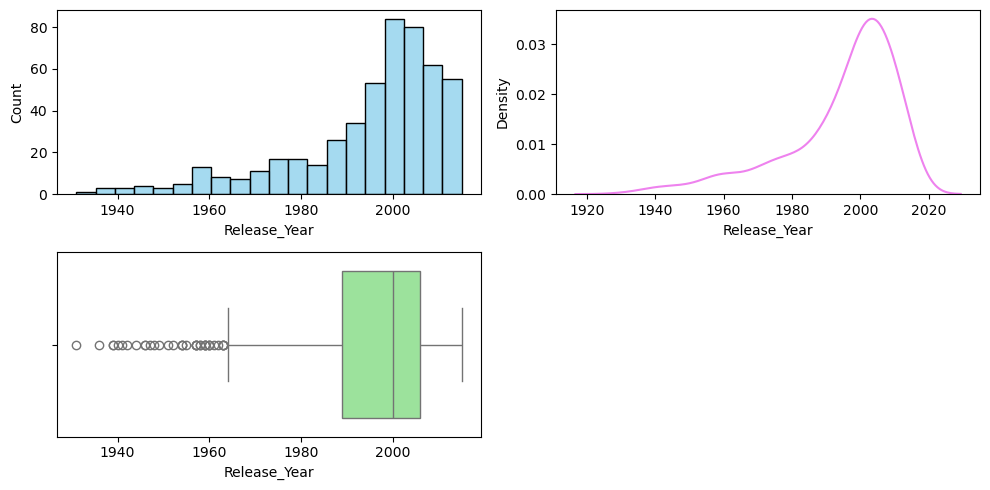

In [13]:
Analysis_num_col(num_df,'Release_Year')

Observation:
1. from histogram we can say that most of the movies from datasets are release after 1965.
2. Kde plot supports abowe statement by showing left skewness.
3. box plot showing some outlier also there in data which release before 1965.

#### Univariate analysis of Time duration column

       Time_duration'M'
count        500.000000
mean         123.606000
std           24.795087
min           76.000000
max          238.000000


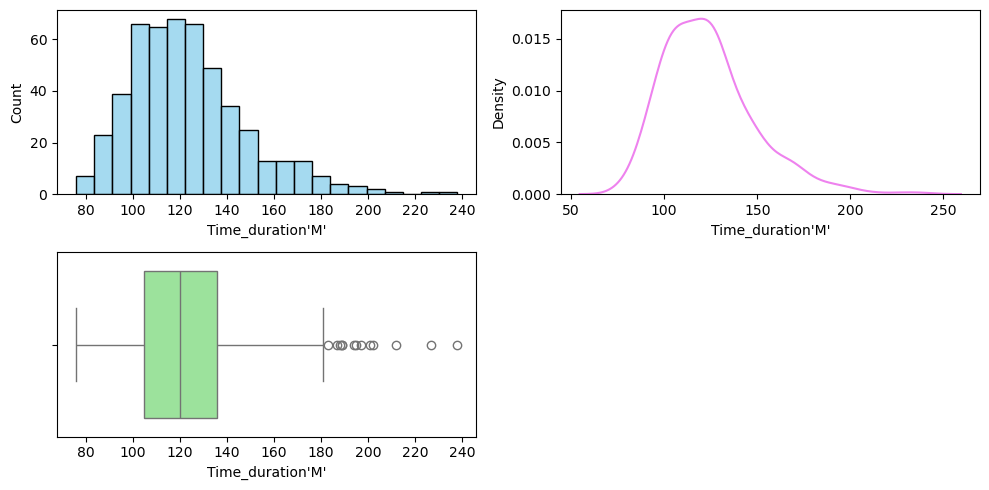

In [14]:
Analysis_num_col(num_df,"Time_duration'M'")

Observation:
1. The most of the movie time duration is in between 90 to 120 Min
2. box plot shows that some extremities are also there in movies who's duation abowe 180 Min.

#### Univariate analysis of Imdb Rating column column

       Imdb_Rating
count   500.000000
mean      7.665200
std       0.589206
min       5.600000
max       9.300000


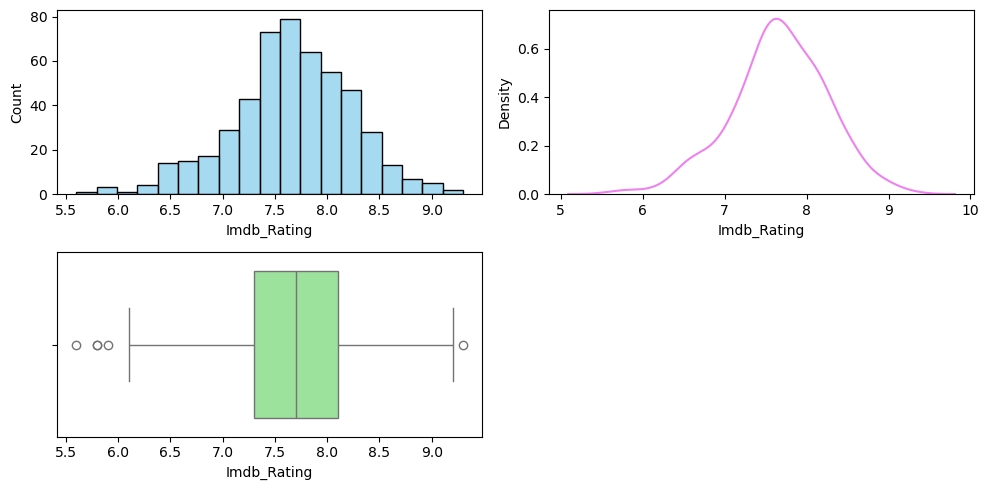

In [15]:
Analysis_num_col(num_df,'Imdb_Rating')

Observation:
1. Most of the movies rating are in between 7.5 and 8
2. some outlier are also there below 6

#### Univariate analysis of Imdb votes column 

         Imdb_votes
count  5.000000e+02
mean   4.902404e+05
std    4.911917e+05
min    8.880000e+02
max    3.000000e+06


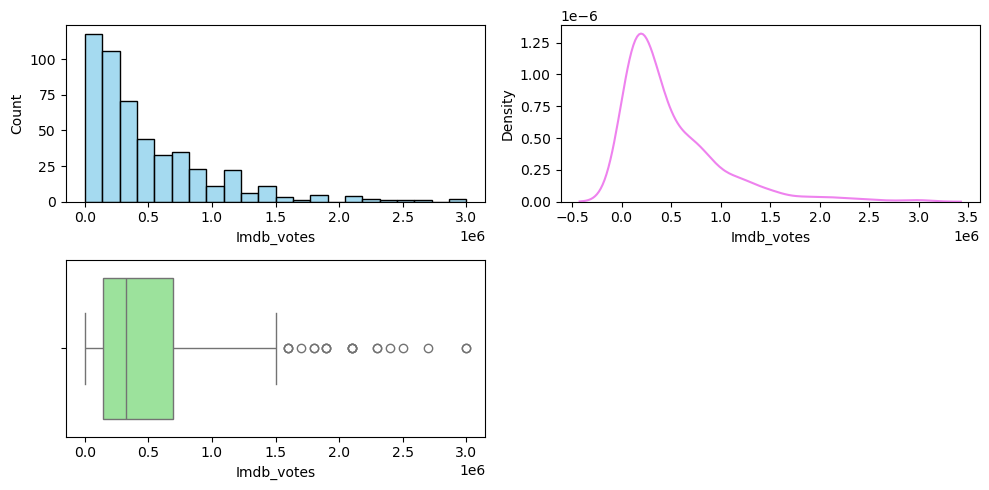

In [16]:
Analysis_num_col(num_df,'Imdb_votes')

Observation:
1. Most of the movies have earn votes in between 100000 and 500000 votes.
2. Outlier are also present in this column showing some movies also have votes more 1.5 million votes.

#### Univariate analysis of Imdb Rating column column

       Meta_score
count  500.000000
mean    73.597880
std     13.553889
min     31.000000
max    100.000000


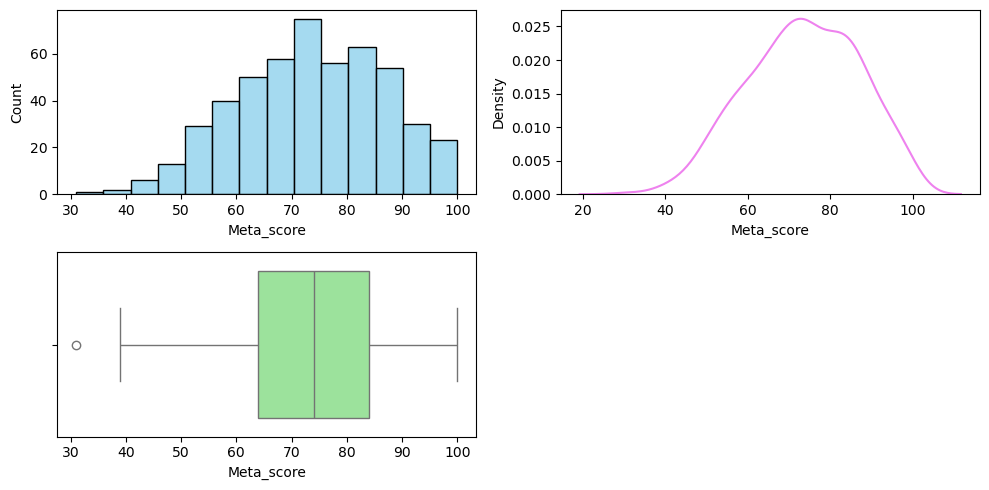

In [17]:
Analysis_num_col(num_df,'Meta_score')

Observation:
* most of the movies have metascore between 65 and 85
* some lower bound outlier are also there in this column.

#### Univariate analysis of Decade column 

            Decade
count   500.000000
mean   1990.460000
std      17.104781
min    1930.000000
max    2010.000000


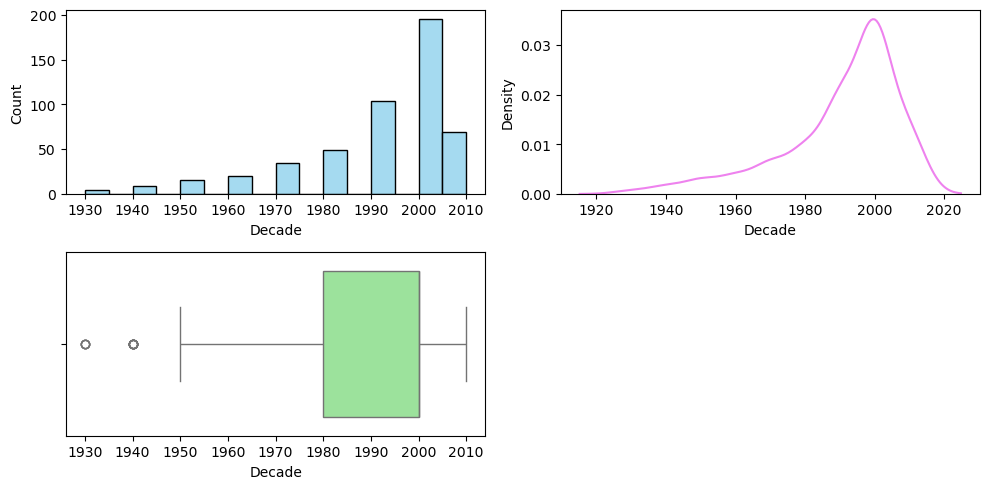

In [18]:
Analysis_num_col(num_df,'Decade')

Observation:
* Most of the movies of this dataset is of 1980-2000 decade
* some lower bound outlier movies are also present below 1950's Decade.

### Treating Outlier of numerical column

In [19]:
num_df.skew()

Release_Year       -1.408844
Time_duration'M'    1.021386
Imdb_Rating        -0.303723
Imdb_votes          1.980537
Meta_score         -0.201277
Decade             -1.338255
dtype: float64

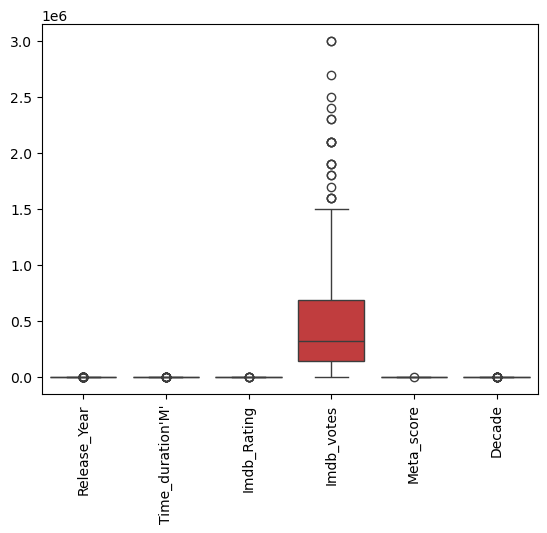

In [20]:
sns.boxplot(num_df)
plt.xticks(rotation=90)
plt.show()

Observation:
* Time duration and Imdb votes column are having positive skew

#### method1 : standard deviation

In [21]:
num_df.median()

Release_Year          2000.0
Time_duration'M'       120.0
Imdb_Rating              7.7
Imdb_votes          323500.0
Meta_score              74.0
Decade                2000.0
dtype: float64

In [22]:
num_df.mean()

Release_Year          1994.79800
Time_duration'M'       123.60600
Imdb_Rating              7.66520
Imdb_votes          490240.37600
Meta_score              73.59788
Decade                1990.46000
dtype: float64

In [23]:
num_df2 = num_df.copy()

In [24]:
mu = round(num_df2["Time_duration'M'"].mean(),2)
std = round(num_df2["Time_duration'M'"].std(),2)
#print(f'mu:{mu}\nstd:{std}')
ll = round(mu - 3*std,2)
ul = round(mu + 3*std,2)
#print(f'll:{ll}\nul:{ul}')
num_df2["Time_duration'M'"] = num_df2["Time_duration'M'"].where(~((num_df2["Time_duration'M'"] <= ll) | (num_df2["Time_duration'M'"] >= ul)), num_df2["Time_duration'M'"].median())

In [25]:
mu = round(num_df2['Imdb_votes'].mean(),2)
std = round(num_df2['Imdb_votes'].std(),2)
#print(f'mu:{mu}\nstd:{std}')
ll = round(mu - 3*std,2)
ul = round(mu + 3*std,2)
#print(f'll:{ll}\nul:{ul}')
num_df2['Imdb_votes'] = num_df2['Imdb_votes'].where(~((num_df2['Imdb_votes'] <= ll) | (num_df2['Imdb_votes'] >= ul)), num_df2['Imdb_votes'].median())

In [26]:
num_df2.skew()

Release_Year       -1.408844
Time_duration'M'    0.709197
Imdb_Rating        -0.303723
Imdb_votes          1.357591
Meta_score         -0.201277
Decade             -1.338255
dtype: float64

Observation : 
* lower the skew of time duration column 1.02 to 0.7 and imdb votes column from 1.98 to 1.35 by std method

### method 2 - By IQR method

In [27]:
num_df.skew()

Release_Year       -1.408844
Time_duration'M'    1.021386
Imdb_Rating        -0.303723
Imdb_votes          1.980537
Meta_score         -0.201277
Decade             -1.338255
dtype: float64

In [28]:
num_df3 = num_df.copy()

In [29]:
def get_IQRValues(df,column):
    q1,q2,q3 = df[column].quantile([0.25,0.5,0.75])
    iqr = q3-q1
    ul =q3 + 1.5*iqr
    ll= q1 - 1.5*iqr
    return ul,ll

In [30]:
get_IQRValues(num_df3,"Time_duration'M'")

(182.5, 58.5)

In [31]:
get_IQRValues(num_df3,'Imdb_votes')

(1507250.0, -672750.0)

In [32]:
ul,ll = get_IQRValues(num_df3,"Time_duration'M'")
num_df3["Time_duration'M'"] = num_df3["Time_duration'M'"].where(~((num_df3["Time_duration'M'"] <= ll) | (num_df3["Time_duration'M'"] >= ul)), num_df3["Time_duration'M'"].median())

In [33]:
ul,ll = get_IQRValues(num_df3,'Imdb_votes')
num_df3['Imdb_votes'] = num_df3['Imdb_votes'].where(~((num_df3['Imdb_votes'] <= ll) | (num_df3['Imdb_votes'] >= ul)), num_df3['Imdb_votes'].median())

In [34]:
num_df3.skew()

Release_Year       -1.408844
Time_duration'M'    0.527057
Imdb_Rating        -0.303723
Imdb_votes          1.167704
Meta_score         -0.201277
Decade             -1.338255
dtype: float64

Observation : 
* treat the skewness of duration column to 1.02 to 0.52 and imdb votes from 1.98 to 1.16

**Note** : observed that in this dataset treating outlier more efficient by IQR method than std method

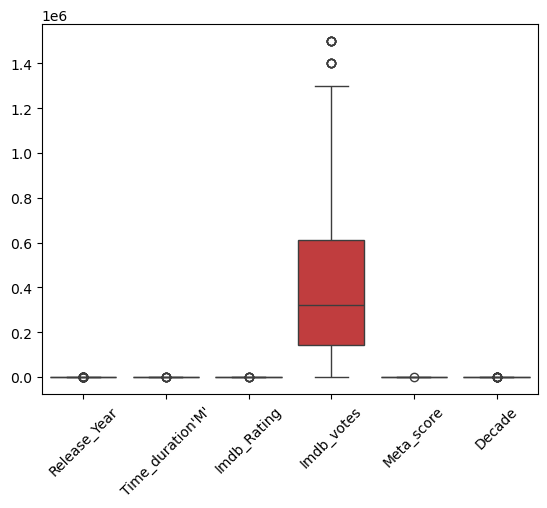

In [35]:
sns.boxplot(num_df3)
plt.xticks(rotation=45)
plt.show()

### Univariate Analysis of Categorical column

In [36]:
cat_df.columns

Index(['Movie_name', 'movie_type', 'Director', 'Actors', 'Movie_Description'], dtype='object')

In [37]:
cat_df.Movie_name.describe()

count                 500
unique                499
top        Kill Bill: Vol
freq                    2
Name: Movie_name, dtype: object

In [38]:
cat_df['Movie_name'].agg(['count','unique'])
plt

<module 'matplotlib.pyplot' from 'C:\\Users\\Dhiraj Rathod\\anaconda3\\anaconda\\Lib\\site-packages\\matplotlib\\pyplot.py'>

In [39]:
def plot_categorical_analysis(df,column):
    print(df[column].agg(['count','unique']))
    print(len(df[column].unique()))
    plt.figure(figsize=(18,18))
    # count_plot
    plt.subplot(3,1,1)
    sns.countplot(data=df,x = column,hue=column ,legend=False)
    plt.title(f'count plot of {column}')
    plt.xlabel(column)
    plt.xticks(rotation=90)
    plt.ylabel('count')
    # pie chart
    plt.subplot(3,1,2)
    df[column].value_counts().nlargest(10).plot.pie(autopct = '%1.f%%',color=sns.color_palette('Set2'))
    plt.title(f'pie plot of {column}')
    # bar plot
    plt.subplot(3,1,3)
    df[column].value_counts().plot(kind='bar',color='red',edgecolor='black')
    plt.title(f'count plot of {column}')
    plt.xlabel(column)
    plt.xticks(rotation=90)
    plt.ylabel('frequency')

    plt.tight_layout()
    plt.show()

count                                                   500
unique    [ The Godfather,  The Silence of the Lambs,  S...
Name: Movie_name, dtype: object
499


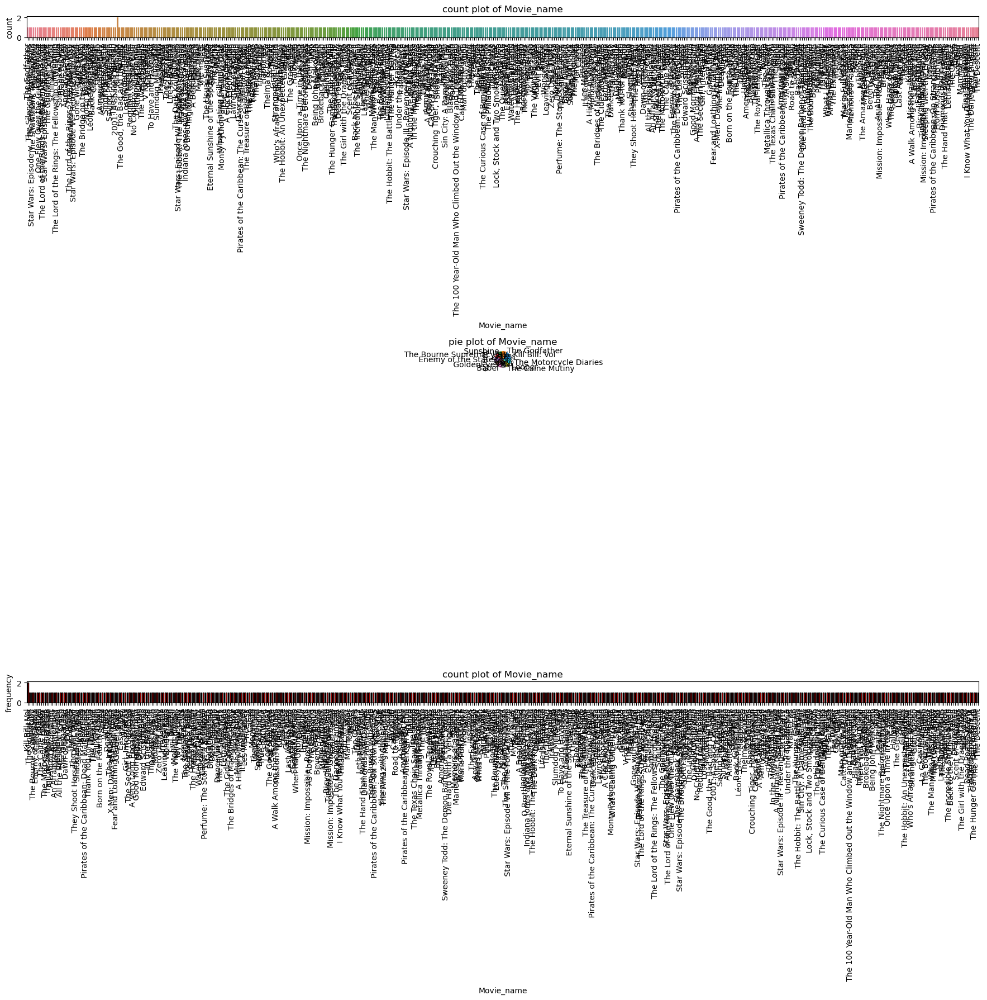

In [40]:
plot_categorical_analysis(cat_df,'Movie_name')

Observation : 
* does not provide any help for analysis

count                                                   500
unique    [R, PG, PG-13, Approved, G, NC-17, Not Rated, ...
Name: movie_type, dtype: object
9


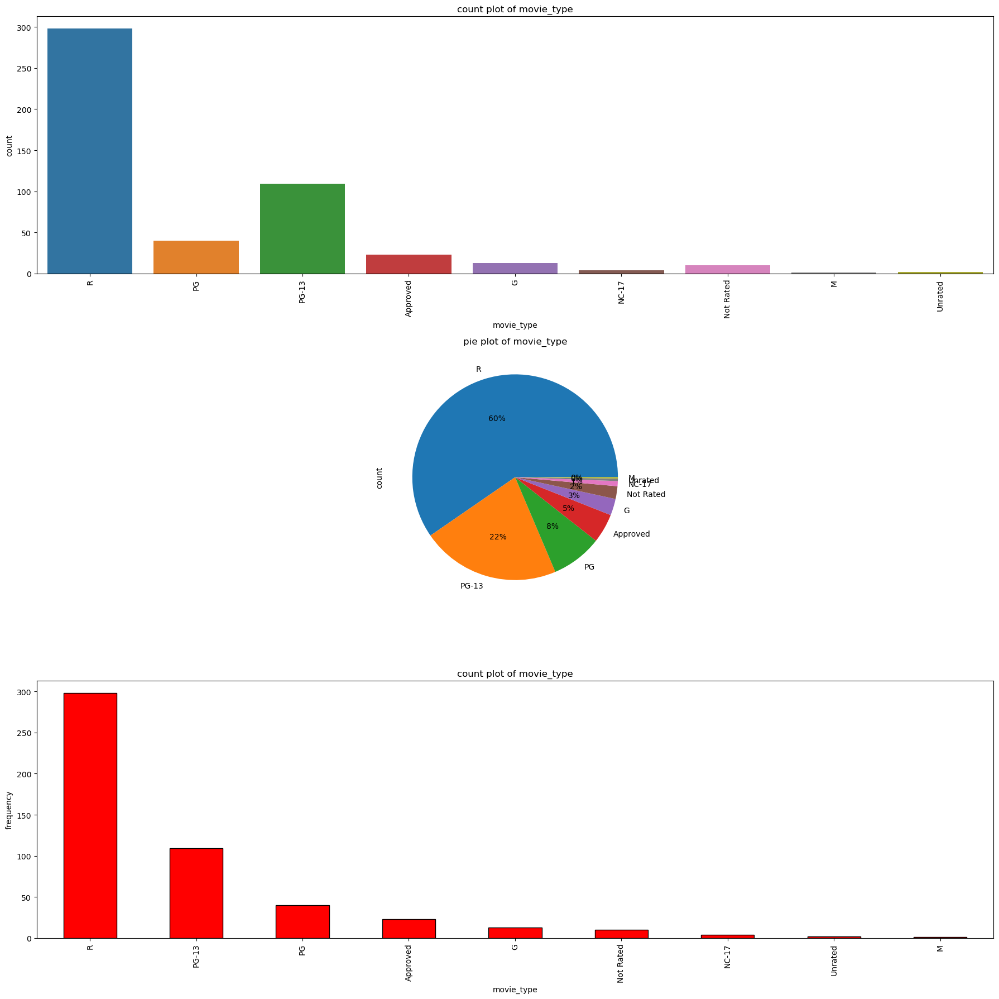

In [41]:
plot_categorical_analysis(cat_df,'movie_type')

Observation : 
* most of the movies are R rated movies

count                                                   500
unique    [Francis Ford Coppola, Jonathan Demme, Irvin K...
Name: Director, dtype: object
285


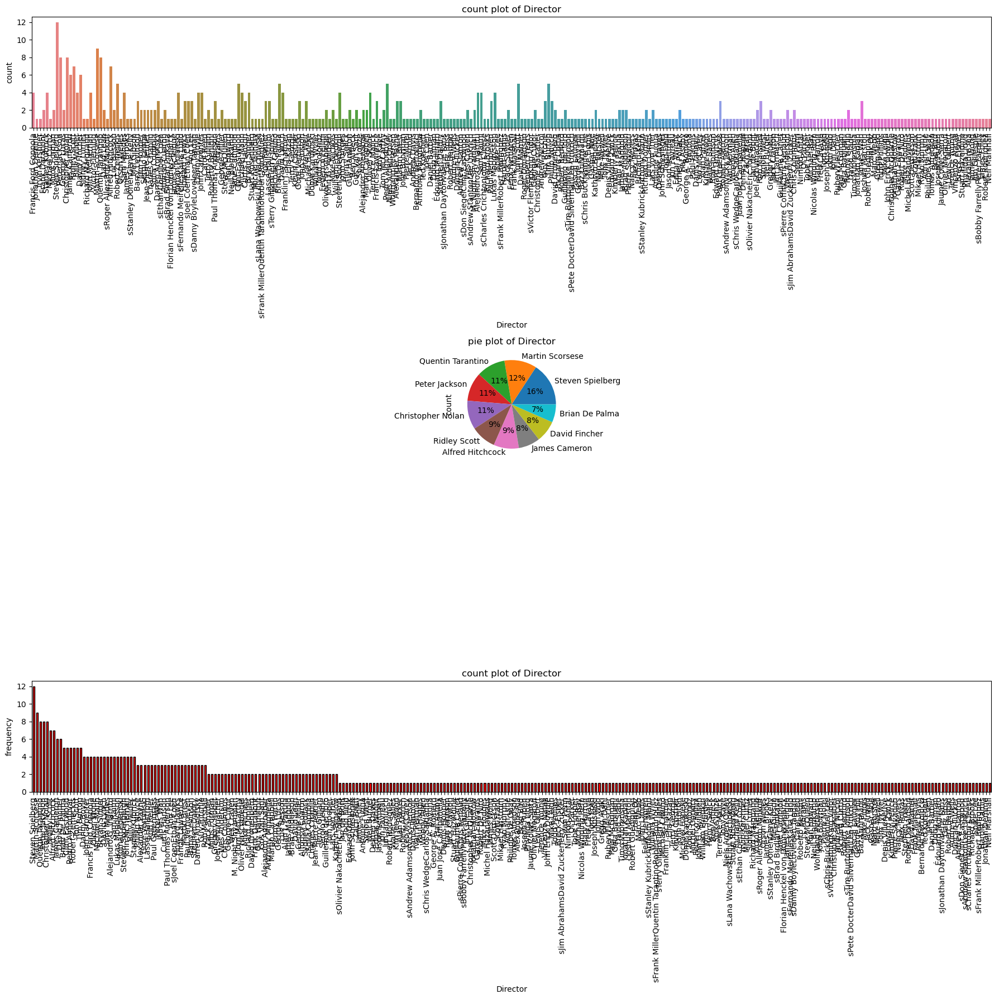

In [42]:
plot_categorical_analysis(cat_df,'Director')

count                                                   500
unique    [Marlon BrandoAl PacinoJames Caan, Jodie Foste...
Name: Actors, dtype: object
494


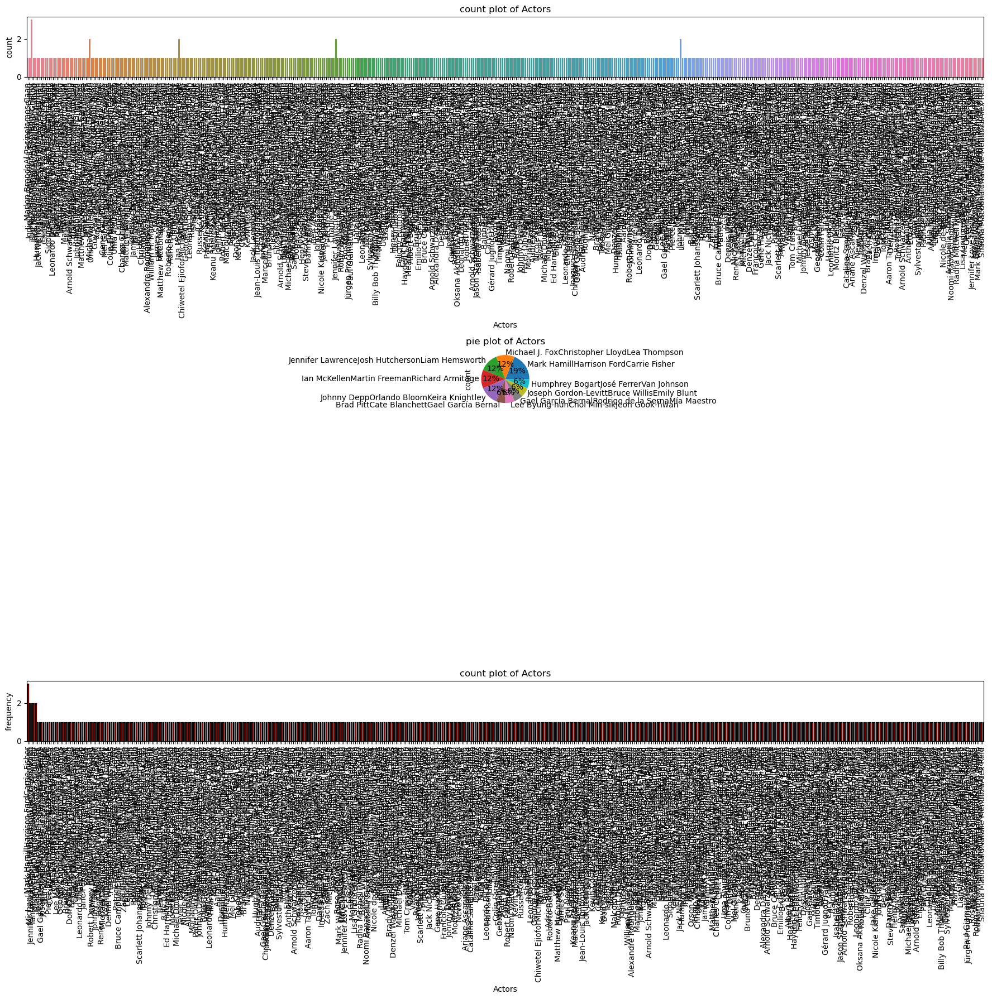

In [43]:
plot_categorical_analysis(cat_df,'Actors')

count                                                   500
unique    [The aging patriarch of an organized crime dyn...
Name: Movie_Description, dtype: object
500


C:\Users\Dhiraj Rathod\AppData\Local\Temp\ipykernel_7388\3592200199.py:24: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


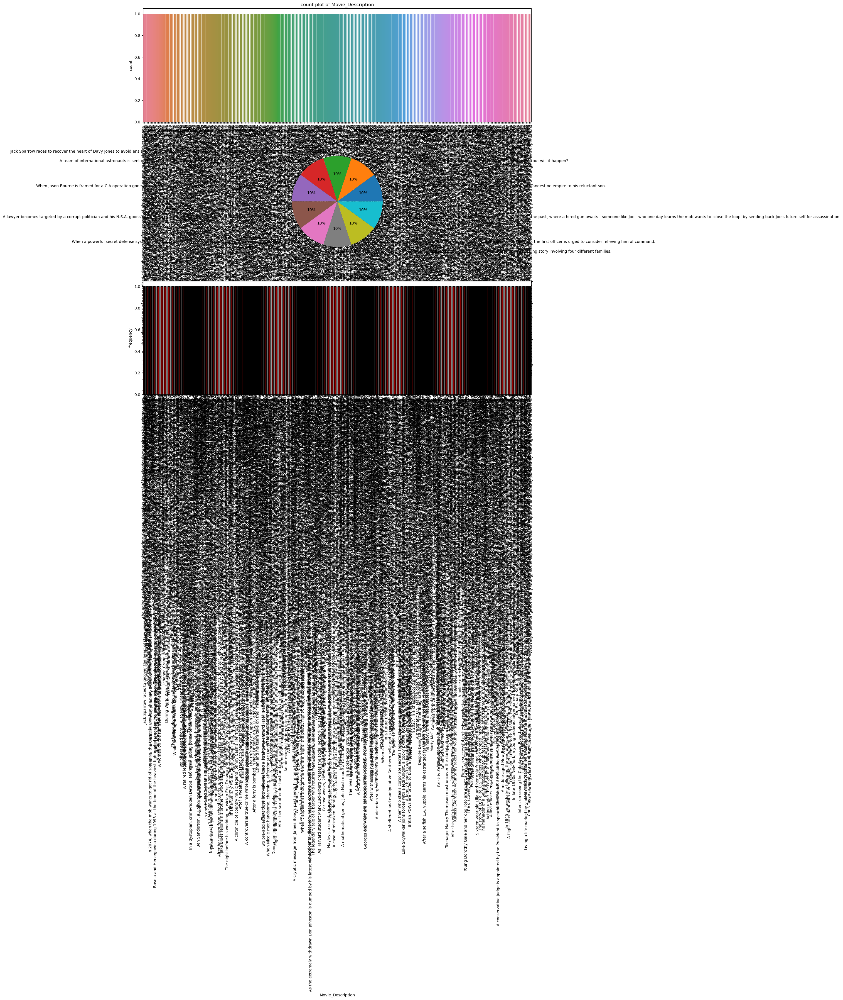

In [44]:
plot_categorical_analysis(cat_df,'Movie_Description')

Observation:
* By categorical univariate analysis we can say some column only help for analysis like movie type and director of movies . 

### Bivariate Analysis/Multivariete

1. **Numerical vs Numerical**

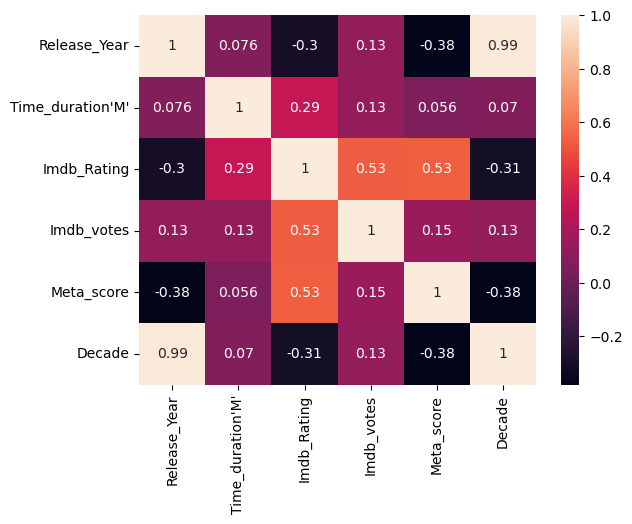

In [46]:
Heatmap_df = num_df3.corr()
sns.heatmap(data=Heatmap_df,annot=True,)
plt.show()

Observation:
* Imdb Rating has positive correlation with meta score and  imdb votes  column of 0.4 

In [47]:
cat_df.columns

Index(['Movie_name', 'movie_type', 'Director', 'Actors', 'Movie_Description'], dtype='object')

In [48]:
df2 = pd.concat([cat_df,num_df3],axis=1)

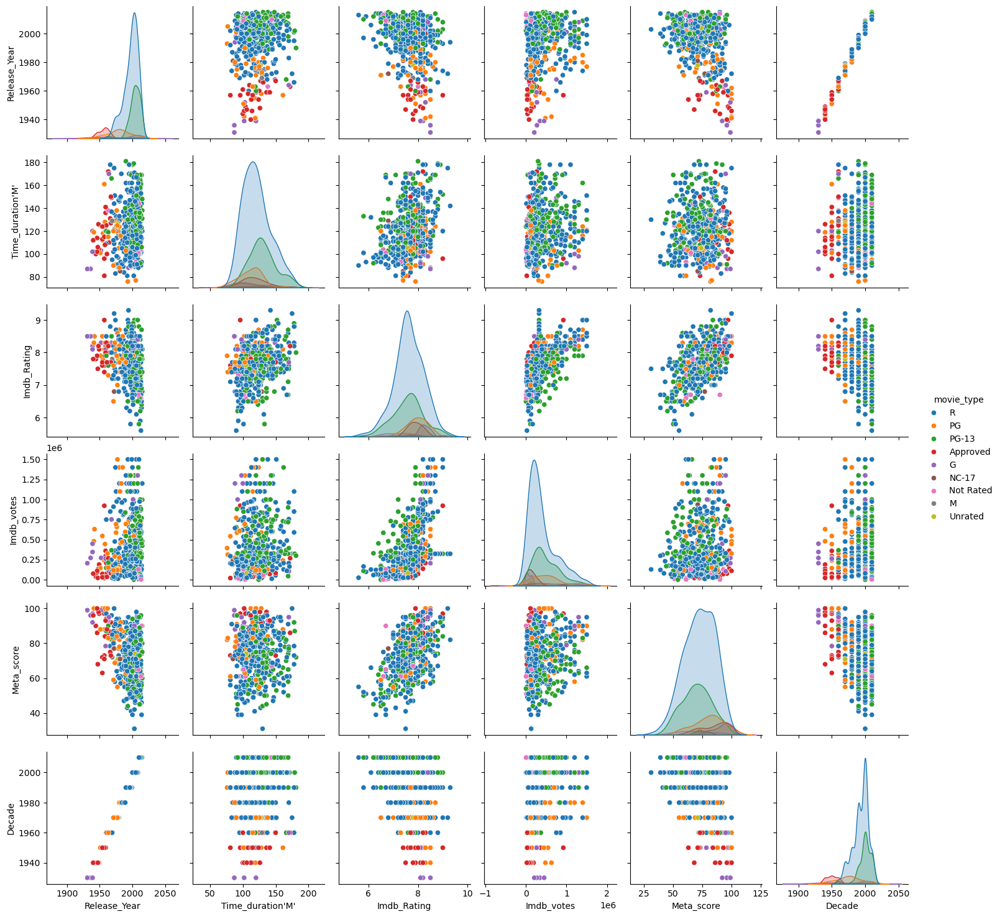

In [49]:
sns.pairplot(data=df2,hue='movie_type')
plt.show()

In [50]:
num_df.columns

Index(['Release_Year', 'Time_duration'M'', 'Imdb_Rating', 'Imdb_votes',
       'Meta_score', 'Decade'],
      dtype='object')

In [51]:
#df2.to_csv('main_without_skew.csv')

2. **Categorical vs Numerical**

In [52]:
def cat_num(df,col1,col2):
    plt.figure(figsize=(10,5))
    sns.barplot(data=df,x=col1,y=col2,hue=col1)
    plt.title(f'{col1} vs {col2}')
    plt.tight_layout()
    plt.show()

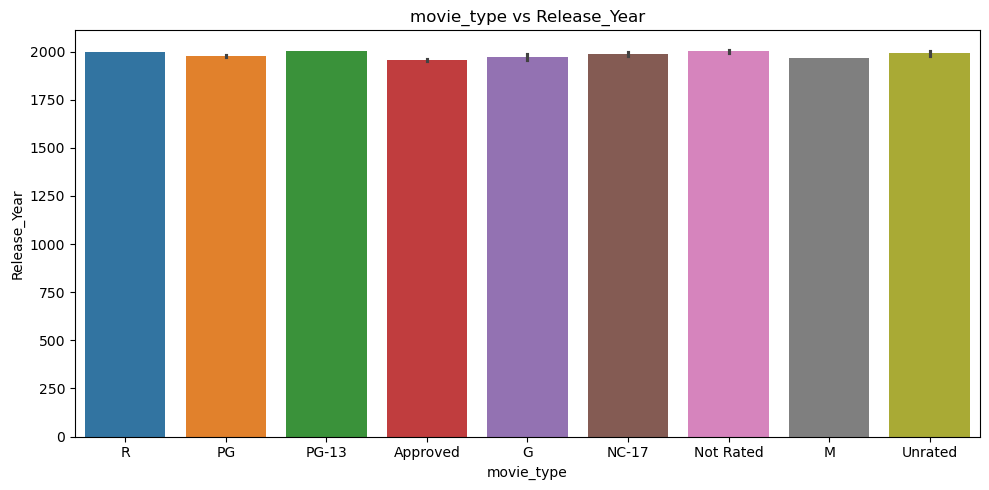

In [53]:
cat_num(df,'movie_type','Release_Year')

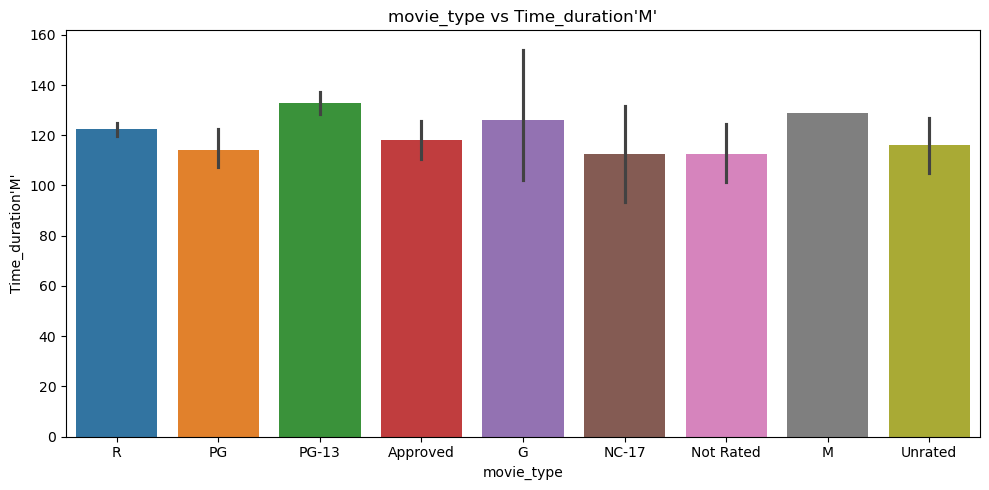

In [54]:
cat_num(df,'movie_type',"Time_duration'M'")

Observation:
* G type movie having low time duration 

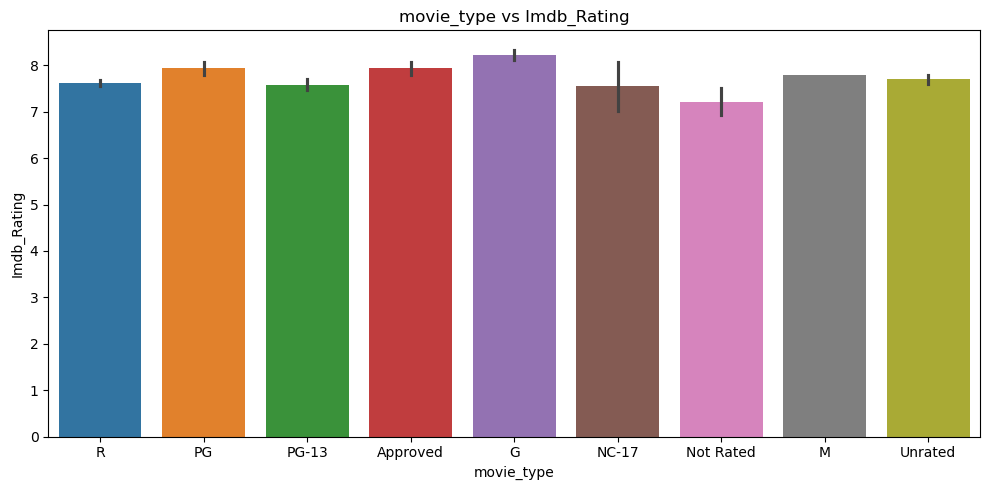

In [55]:
cat_num(df,'movie_type','Imdb_Rating')

Observation:
* G type movie having max imdb rating than any other type of movies.

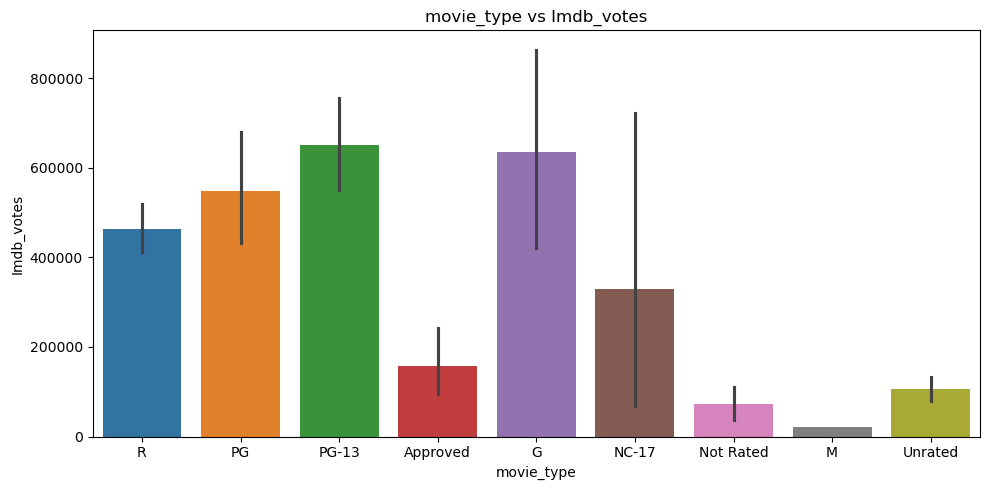

In [56]:
cat_num(df,'movie_type','Imdb_votes')

Observation:
* G type movie having maximum Imdb votes

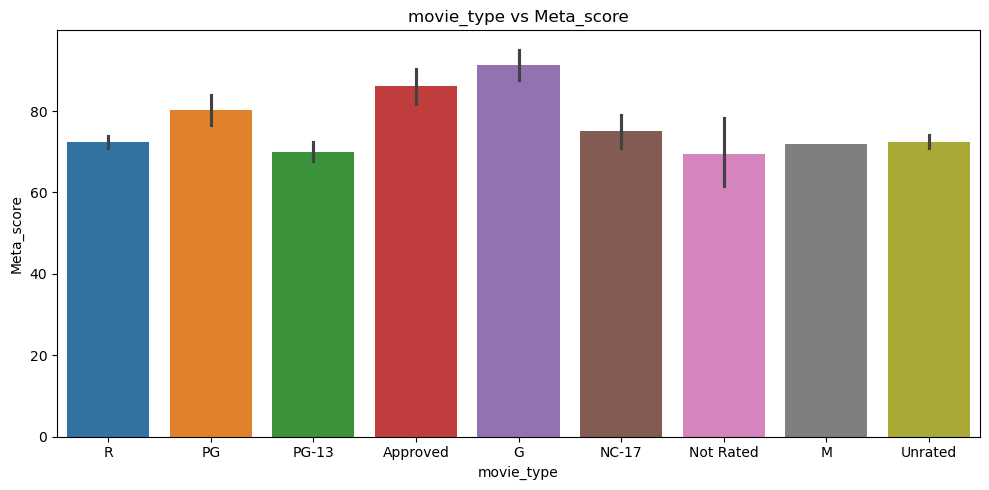

In [57]:
cat_num(df,'movie_type','Meta_score')

Observation:
* G type movie having high metascore than other movie type.

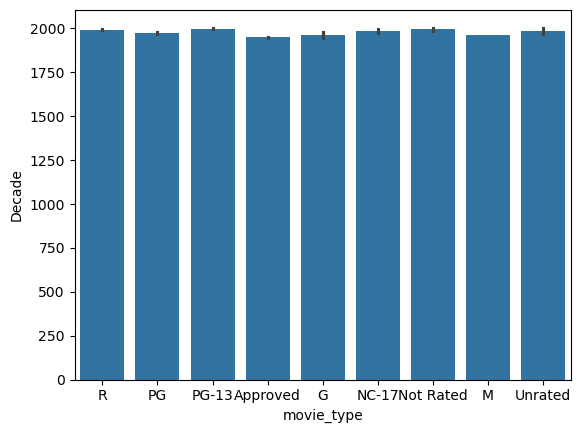

In [58]:
sns.barplot(data=df,x='movie_type',y='Decade')
plt.show()